In [ ]:
# Tomographic Reconstruction with Compressed Sensing Electron Tomography (CS-ET)
# A CUDA device can be used
# Jinseok Ryu (jinseuk56@gmail.com)
# https://doi.org/10.1021/acsnano.4c10677

In [1]:
import numpy as np
from CAETomo.reconstruction import CSET

In [2]:
import torch
if torch.cuda.is_available():
    print("%d gpu available"%(torch.cuda.device_count()))
    cuda_device = torch.device("cuda:0")
    print(torch.cuda.get_device_name(cuda_device))
    torch.cuda.set_device(cuda_device)
else:
    cuda_device = None

1 gpu available
NVIDIA GeForce RTX 4050 Laptop GPU


In [ ]:
from tkinter import Tk
import tkinter.filedialog as tkf
root = Tk()
root.attributes('-topmost', True)  # Display the dialog in the foreground.
root.iconify()

ts_adr = tkf.askopenfilenames()
print(len(ts_adr))
print(*ts_adr, sep="\n")

In [4]:
ta = np.linspace(-70, 40, 12)
print(ta)
print(ta.shape)
print(ta.dtype)
ta = ta*np.pi/180

[-70. -60. -50. -40. -30. -20. -10.   0.  10.  20.  30.  40.]
(12,)
float64


In [5]:
recon = CSET(ts_adr, ta, cuda_device=cuda_device)

cuda device:  cuda:0


In [6]:
recon.NUFFT(pad_ratio=2.0, tilt_axis="horizontal")

-------------------------  --------------
total number of iteration  100
lambda_L1                  0.0005
lambda_TV                  3.0
learning rate              2e-05
save the result (tiff)     False
prefix for save            reconstructed_
-------------------------  --------------


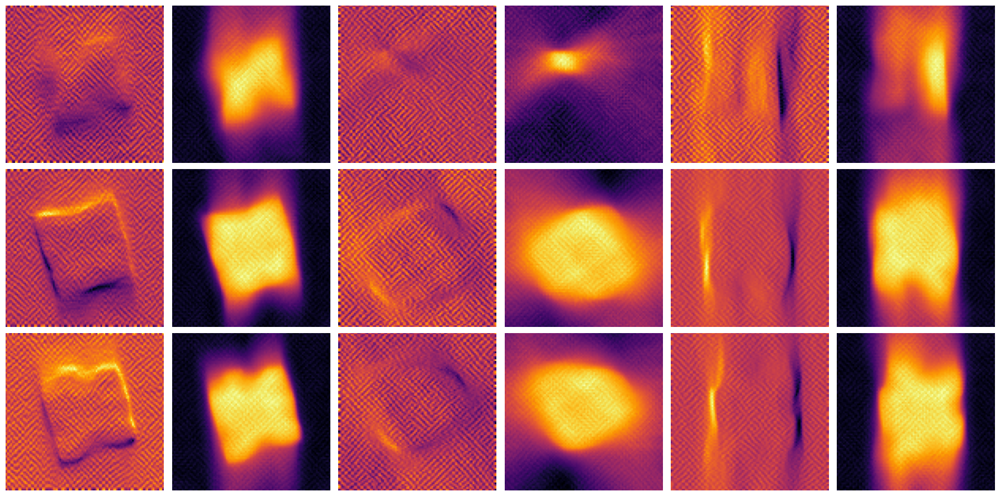

----------  ---------  ---------
epoch          20
total loss  15121.6
-main loss  14269.1    94.3625
-L1 loss      135.364   0.895171
-TV reg.      717.123   4.74237
----------  ---------  ---------


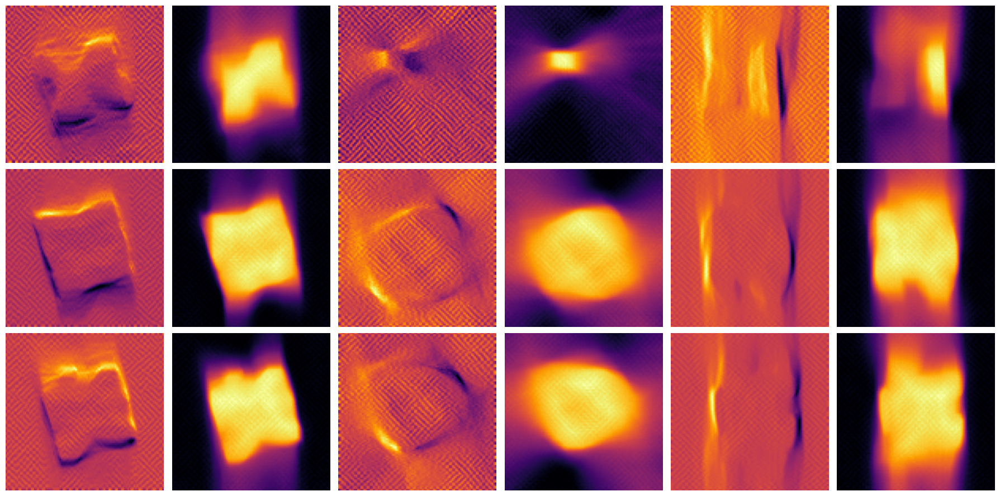

----------  ---------  --------
epoch          40
total loss  10592.7
-main loss   9526.56   89.9351
-L1 loss      172.259   1.6262
-TV reg.      893.891   8.43874
----------  ---------  --------


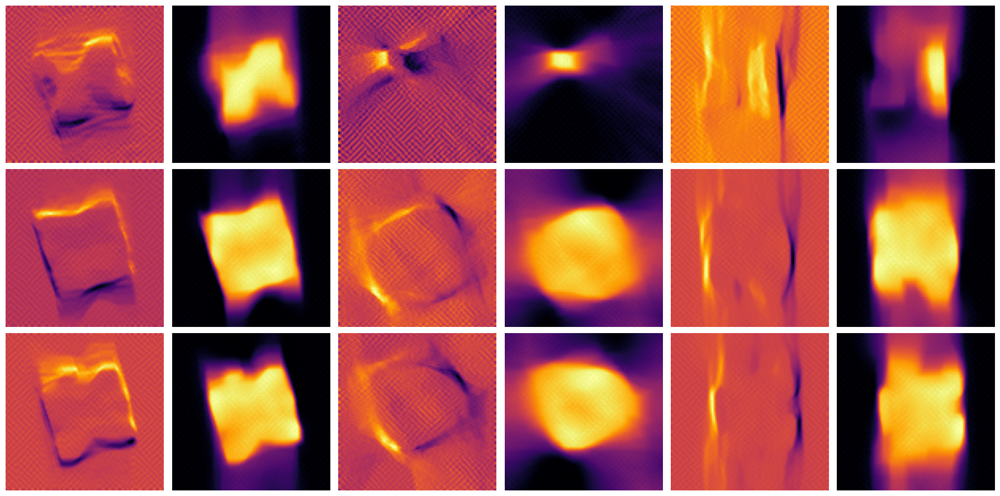

----------  --------  --------
epoch         60
total loss  8349.65
-main loss  7057.07   84.5193
-L1 loss     211.361   2.53138
-TV reg.    1081.22   12.9493
----------  --------  --------


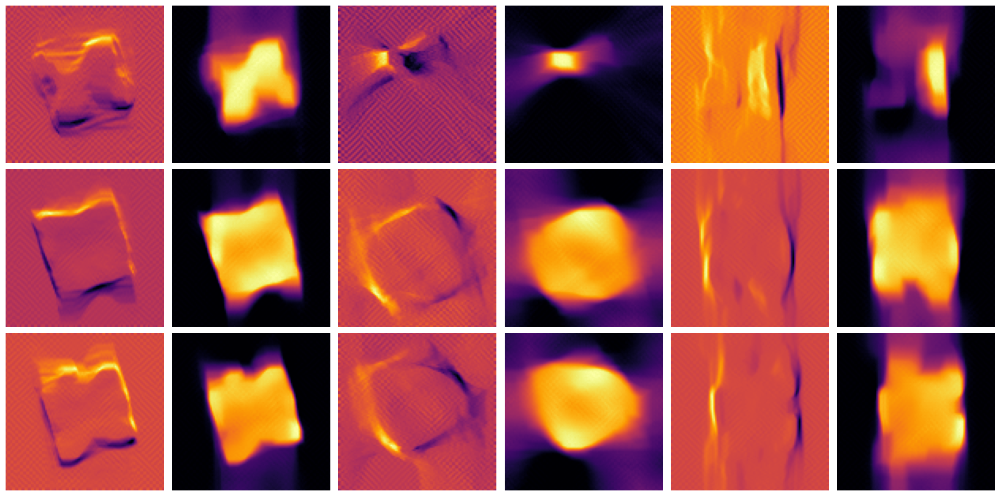

----------  --------  -------
epoch         80
total loss  7372.59
-main loss  5898.54   80.0064
-L1 loss     242.934   3.2951
-TV reg.    1231.12   16.6985
----------  --------  -------


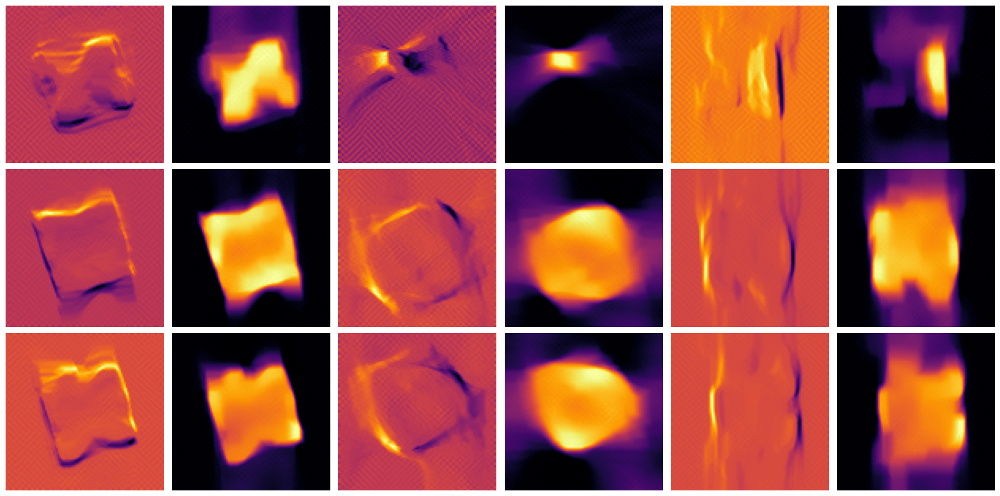

----------  --------  --------
epoch        100
total loss  6808.92
-main loss  5187.8    76.1912
-L1 loss     268.012   3.93619
-TV reg.    1353.11   19.8726
----------  --------  --------
The 1 optimization has been finished.


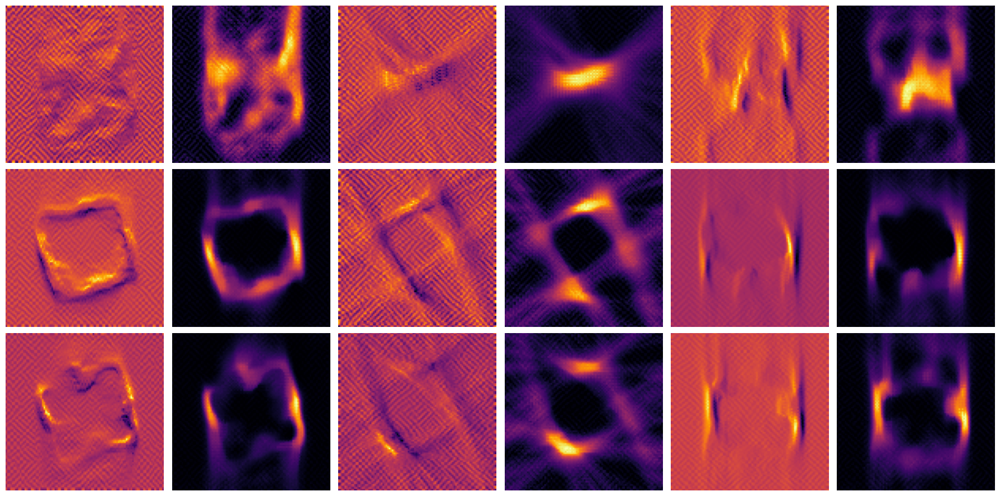

----------  --------  --------
epoch         20
total loss  4859.75
-main loss  4006.94   82.4515
-L1 loss     114.964   2.36564
-TV reg.     737.852  15.1829
----------  --------  --------


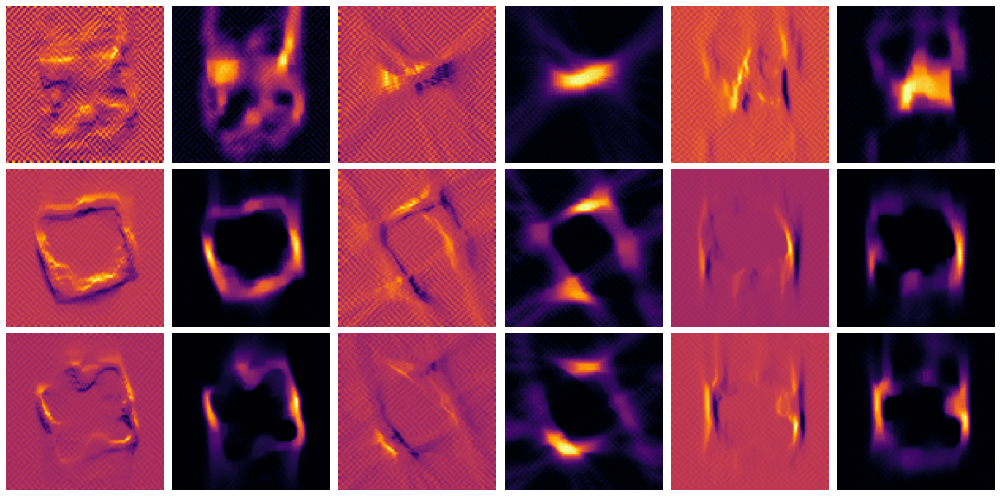

----------  --------  --------
epoch         40
total loss  4495.86
-main loss  3508.13   78.0302
-L1 loss     114.872   2.55507
-TV reg.     872.858  19.4147
----------  --------  --------


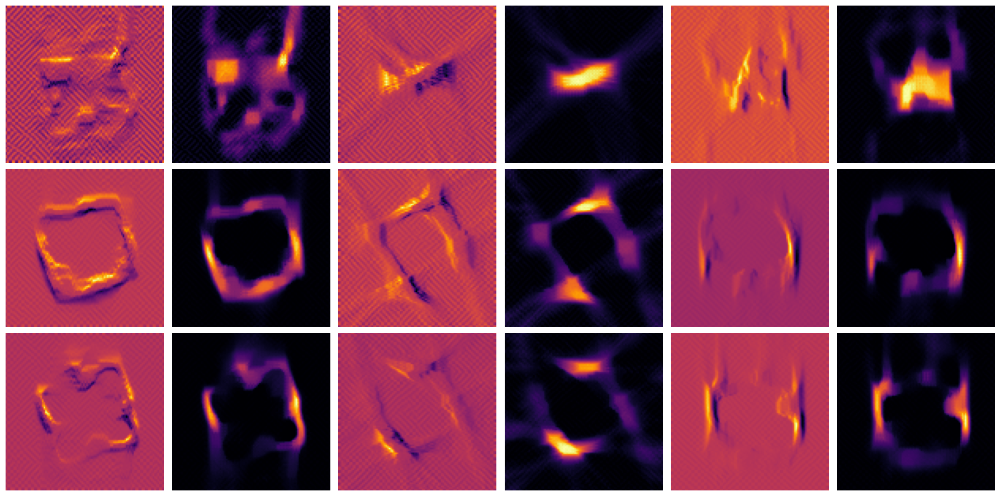

----------  --------  --------
epoch         60
total loss  4334.81
-main loss  3238.82   74.7166
-L1 loss     122.679   2.83009
-TV reg.     973.306  22.4533
----------  --------  --------


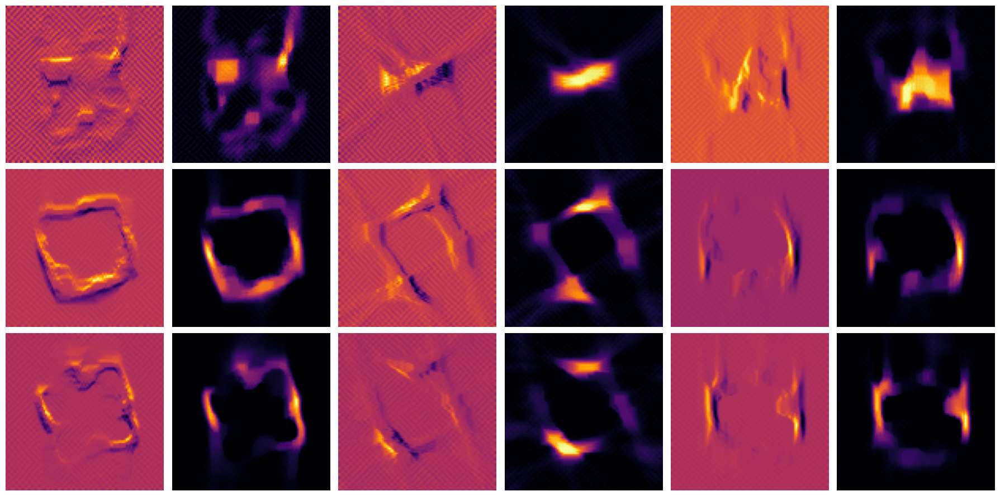

----------  --------  --------
epoch         80
total loss  4255.93
-main loss  3081.16   72.3968
-L1 loss     132.572   3.11499
-TV reg.    1042.2    24.4882
----------  --------  --------


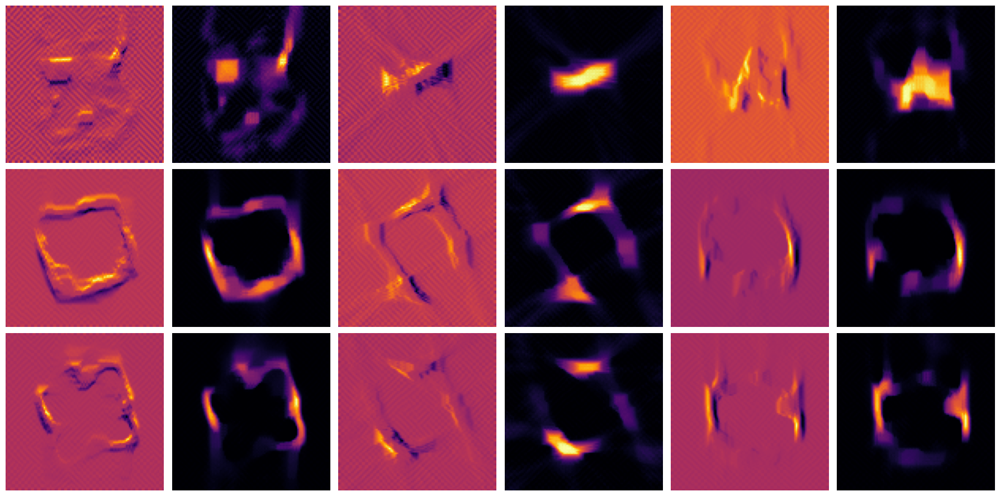

----------  --------  --------
epoch        100
total loss  4215.54
-main loss  2985.6    70.8237
-L1 loss     140.974   3.34414
-TV reg.    1088.97   25.8322
----------  --------  --------
The 2 optimization has been finished.


In [7]:
recon.recontruct(n_iter=100, 
                 lmbd_l1=5E-4,
                 lmbd_tv=3.0, 
                 l_rate=2E-5,
                 save_result=False,
                 save_adr="reconstructed_")